In [1]:
from google.colab import drive

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Mount Google Drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
cd /content/drive/MyDrive/_HKU/MStat/Yr 1 sem 2/STAT8017_Data mining techniques/Project/working/tic

/content/drive/MyDrive/_HKU/MStat/Yr 1 sem 2/STAT8017_Data mining techniques/Project/working/tic


In [3]:
import pandas as pd

# Load the data
# dictionary = pd.read_csv('dictionary.txt', sep='\t', header=None, encoding='utf-8')
ticdata = pd.read_csv('ticdata2000.txt', sep='\t', header=None, encoding='utf-8')
# ticdata_descr = pd.read_csv('TicDataDescr.txt', sep='\t', header=None, encoding='utf-8')
ticeval = pd.read_csv('ticeval2000.txt', sep='\t', header=None, encoding='utf-8')
tictgts = pd.read_csv('tictgts2000.txt', sep='\t', header=None, encoding='utf-8')

# Feature engineering

In [4]:
from scipy import stats
import statsmodels.api as sm
import seaborn as sns

In [5]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

In [6]:
ticdata[43_64] = ticdata[43]*ticdata[64]
ticdata[44_65] = ticdata[44]*ticdata[65]
ticdata[45_66] = ticdata[45]*ticdata[66]
ticdata[46_67] = ticdata[46]*ticdata[67]
ticdata[47_68] = ticdata[47]*ticdata[68]
ticdata[48_69] = ticdata[48]*ticdata[69]
ticdata[49_70] = ticdata[49]*ticdata[70]
ticdata[50_71] = ticdata[50]*ticdata[71]
ticdata[51_72] = ticdata[51]*ticdata[72]
ticdata[52_73] = ticdata[52]*ticdata[73]
ticdata[53_74] = ticdata[53]*ticdata[74]
ticdata[54_75] = ticdata[54]*ticdata[75]
ticdata[55_76] = ticdata[55]*ticdata[76]
ticdata[56_77] = ticdata[56]*ticdata[77]
ticdata[57_78] = ticdata[57]*ticdata[78]
ticdata[58_79] = ticdata[58]*ticdata[79]
ticdata[59_80] = ticdata[59]*ticdata[80]
ticdata[60_81] = ticdata[60]*ticdata[81]
ticdata[61_82] = ticdata[61]*ticdata[82]
ticdata[62_83] = ticdata[62]*ticdata[83]
ticdata[63_84] = ticdata[63]*ticdata[84]

In [7]:
for _ in range(43,84+1):
  ticdata = ticdata.drop(columns=_)

image.png

In [8]:
ticdata1 = ticdata[[0, 4,    5,   15,   16,   17,   18,   19,   20,   21,   22,   23, 24,   25,   26,   27,   28,   29,   30,   31,   32,   33,   34,   35, 36,   37,   38,   39,   40,   41,   42]]
_ticdata2_cols = list(set(ticdata.columns) - set(ticdata1.columns))
_ticdata2_col = [_ for _ in _ticdata2_cols if len(str(_)) <= 2]
_ticdata2_col.remove(85)
ticdata2 = ticdata[_ticdata2_col]
ticdata2
_ticdata3_col = [_ for _ in _ticdata2_cols if len(str(_)) > 2]
ticdata3 = ticdata[_ticdata3_col]

In [9]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(ticdata1)

# Choose number of components to explain ~90-95% variance
pca = PCA(n_components=0.7)
X_pca = pca.fit_transform(X_scaled)

print(f'Explained variance ratio by PCA components: {pca.explained_variance_ratio_}')
print(f'Cumulative explained variance: {pca.explained_variance_ratio_.cumsum()}')

loadings = pd.DataFrame(pca.components_.T,
                        columns=[f'PC{i+1}' for i in range(pca.n_components_)])

print("Top contributing features per principal component:")
for i in range(pca.n_components_):
    print(f"\nPC{i+1} top features:")
    print(loadings.iloc[:, i].abs().sort_values(ascending=False).head(15))

Explained variance ratio by PCA components: [0.27859248 0.08917962 0.08388565 0.06242216 0.04574904 0.04263358
 0.04020437 0.03756176 0.03519166]
Cumulative explained variance: [0.27859248 0.3677721  0.45165775 0.51407991 0.55982894 0.60246253
 0.64266689 0.68022865 0.71542031]
Top contributing features per principal component:

PC1 top features:
5     0.269865
23    0.255704
22    0.255516
12    0.247444
3     0.239147
6     0.239109
29    0.232878
15    0.227614
30    0.227533
0     0.210599
1     0.204233
17    0.194546
18    0.194472
26    0.191065
24    0.190056
Name: PC1, dtype: float64

PC2 top features:
17    0.337500
18    0.337448
9     0.300009
1     0.286734
0     0.265185
13    0.252922
8     0.252501
20    0.248689
21    0.231686
5     0.221427
4     0.220208
24    0.214966
10    0.206115
29    0.136102
15    0.135596
Name: PC2, dtype: float64

PC3 top features:
19    0.352577
9     0.352105
25    0.304709
21    0.293146
24    0.243177
12    0.241634
16    0.234915
13    

In [10]:
scaler = StandardScaler()
X_scaled2 = scaler.fit_transform(ticdata2)

# Choose number of components to explain ~90-95% variance
pca2 = PCA(n_components=0.7)
X_pca2 = pca2.fit_transform(X_scaled2)

print(f'Explained variance ratio by PCA components: {pca2.explained_variance_ratio_}')
print(f'Cumulative explained variance: {pca2.explained_variance_ratio_.cumsum()}')

loadings2 = pd.DataFrame(pca2.components_.T,
                        columns=[f'PC{i+1}' for i in range(pca2.n_components_)])

print("Top contributing features per principal component:")
for i in range(pca2.n_components_):
    print(f"\nPC{i+1} top features:")
    print(loadings2.iloc[:, i].abs().sort_values(ascending=False).head(15))

Explained variance ratio by PCA components: [0.31596354 0.16860247 0.13058755 0.10524877]
Cumulative explained variance: [0.31596354 0.484566   0.61515356 0.72040233]
Top contributing features per principal component:

PC1 top features:
9     0.437258
6     0.437187
1     0.426509
11    0.420592
8     0.418978
7     0.163923
2     0.161617
4     0.105935
3     0.096279
10    0.082909
5     0.053867
0     0.008020
Name: PC1, dtype: float64

PC2 top features:
3     0.536226
5     0.521321
2     0.354686
10    0.335519
7     0.260395
11    0.244112
6     0.169626
1     0.167851
8     0.088502
4     0.088250
9     0.038101
0     0.029917
Name: PC2, dtype: float64

PC3 top features:
10    0.647862
8     0.341541
7     0.337784
11    0.281646
3     0.280794
9     0.271887
5     0.222017
6     0.150489
1     0.128199
0     0.124219
4     0.110411
2     0.037944
Name: PC3, dtype: float64

PC4 top features:
2     0.536090
7     0.533744
3     0.368816
5     0.338875
0     0.288471
6     0.26800

In [11]:
PCA1_df = pd.DataFrame(X_pca)
_PCA1_df_cols = []
for _ in PCA1_df.columns:
  idx = _ + 1
  _PCA1_df_cols.append("PCA experiement 1 component {}".format(idx))

PCA1_df.columns = _PCA1_df_cols

In [12]:
PCA2_df = pd.DataFrame(X_pca2)
_PCA2_df_cols = []
for _ in PCA2_df.columns:
  idx = _ + 1
  _PCA2_df_cols.append("PCA experiement 2 component {}".format(idx))

PCA2_df.columns = _PCA2_df_cols

In [13]:
ticdata3.columns = [str(_) for _ in list(ticdata3.columns)]
ticdata3

,4869,4364,6283,5778,5273,4768,6182,5677,5172,4667,...,5576,5071,4566,5980,5475,4970,6384,4465,5879,5374
0,0,0,0,0,0,0,0,0,0,6,...,0,0,0,0,0,0,0,0,5,0
1,0,4,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,2,0
2,0,2,0,0,0,0,0,0,0,6,...,0,0,0,0,0,0,0,0,2,0
3,0,0,0,0,0,0,0,0,0,6,...,0,0,0,0,0,0,0,0,2,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5817,4,2,0,0,0,0,0,0,0,6,...,0,0,0,0,6,0,0,0,3,0
5818,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,5,3
5819,0,2,0,0,0,0,0,0,0,6,...,0,0,0,0,0,0,0,0,4,0
5820,0,0,0,0,0,0,0,0,0,6,...,0,0,0,0,0,0,0,0,0,0


In [14]:
target_df = ticdata[85]
target_df.rename('y',inplace=True)
target_df

,y
0,0
1,0
2,0
3,0
4,0
...,...
5817,0
5818,0
5819,1
5820,0


In [15]:
df_tmp = pd.concat([PCA1_df,PCA2_df],axis=1)
df_tmp2 = pd.concat([df_tmp,ticdata3],axis=1)
df = pd.concat([df_tmp2,target_df],axis=1)

cv:  [0.91416309 0.91845494 0.91416309 0.91845494 0.92274678]
cv_mean:  0.9175965665236051
accuracy:  0.9261802575107296


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


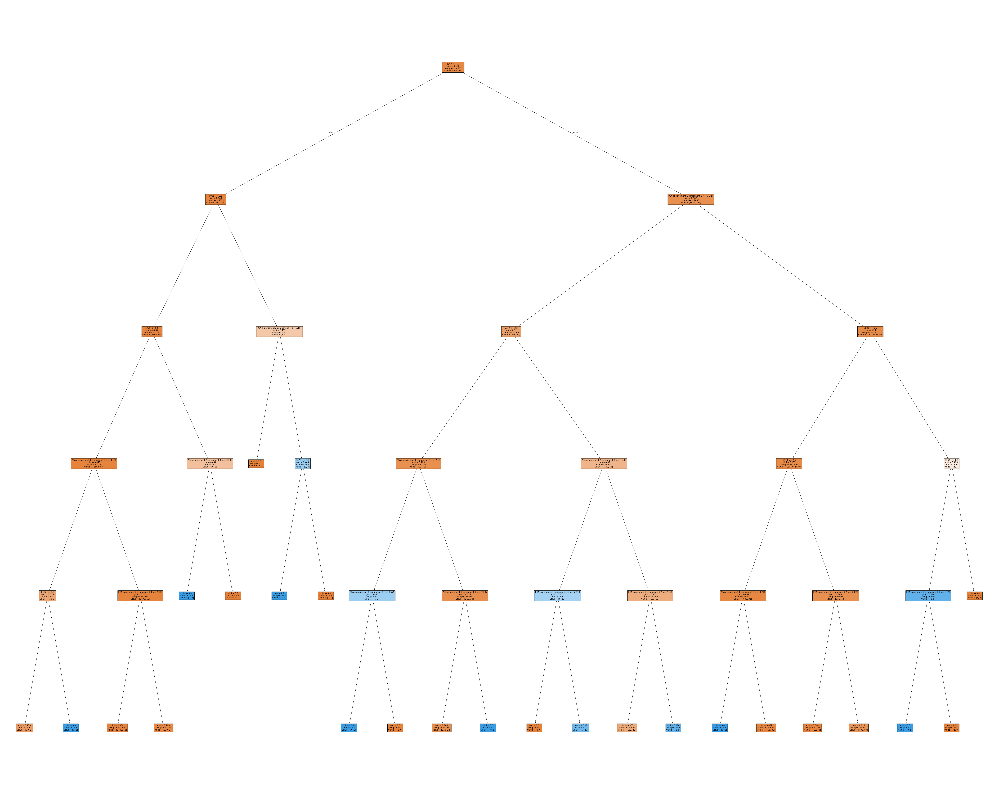

In [16]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score


# Split the data into features and target variable
y = df['y']
X = df.drop(columns='y')

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Instantiate a DecisionTreeClassifier 'dt' with a maximum depth of 6
dt = DecisionTreeClassifier(max_depth=5, random_state=42)

# Fit dt to the training set
dt.fit(X_train, y_train)
DecisionTreeClassifier(max_depth=5, random_state=42)
cv = cross_val_score(dt,X_test.values,y_test.values,cv=5)

print("cv: ",cv)
print("cv_mean: ",cv.mean())
print("accuracy: ",dt.score(X_test.values, y_test.values))

from sklearn import tree
from matplotlib import pyplot as plt

#fig = plt.figure(figsize=(25,20))
fig = plt.figure(figsize=(100,80))
_ = tree.plot_tree(dt, feature_names=X_train.columns.tolist(), filled=True)